<p style="font-family: Arial Bold; font-size:3.0em;color:Green; font-style:bold"><br>
Satellite Image Data <br></p>


<p style="font-family: Arial; font-size:2.0em;color:Green; font-style:bold"><br>
Analysis using Numpy <br></p>


<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold"><br>Data Source: Pulsar space  - california fires</p>


Southern California suffers a wave of devastating fires that have burned an area of more than 65,000 hectares and forced thousands to evacuate. The drought in the area has made this a particularly tragic year in in terms of large-scale fires.

Fires have been captured by different satellites. In the following images, captured by ESA satellites and processed by pulsar Space, we can see an image of the area at north of Ventura (California) where fires are actives. The real color image allows us to intuit the magnitude of the fires because the enormous clouds of smoke. However, it is the second image where we can see the magnitude of the fires because a composed image (we will use this image), where we get through the smoke and clouds and see the active fires.

We will analyze a sample satellite image data. This example has been taken from http://www.pulsarspace.com/en/news/view/california-fires for demonstration/teaching purpose only. Instead of using misc from scipy, we will use imageio.imread to read the image data.

More on how to read a satellite image data: https://earthobservatory.nasa.gov/features/ColorImage/page2.php

About mixing colors: http://www.webexhibits.org/causesofcolor/1BA.html

In [2]:
%matplotlib inline
import numpy as np
import scipy as sc
from scipy import misc
import imageio

import matplotlib.pyplot as plt

<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold">
Creating a numpy array from an image file:</p> 

<br>
Lets choose a wildfire satellite image file and display its type.


In [3]:
image_data = imageio.imread('./wildfire/cf_fire.jpg')
#image_data = misc.imread('./wildfire/cf_fire.jpg')
type(image_data)

imageio.core.util.Array

Let's see what the image looks like

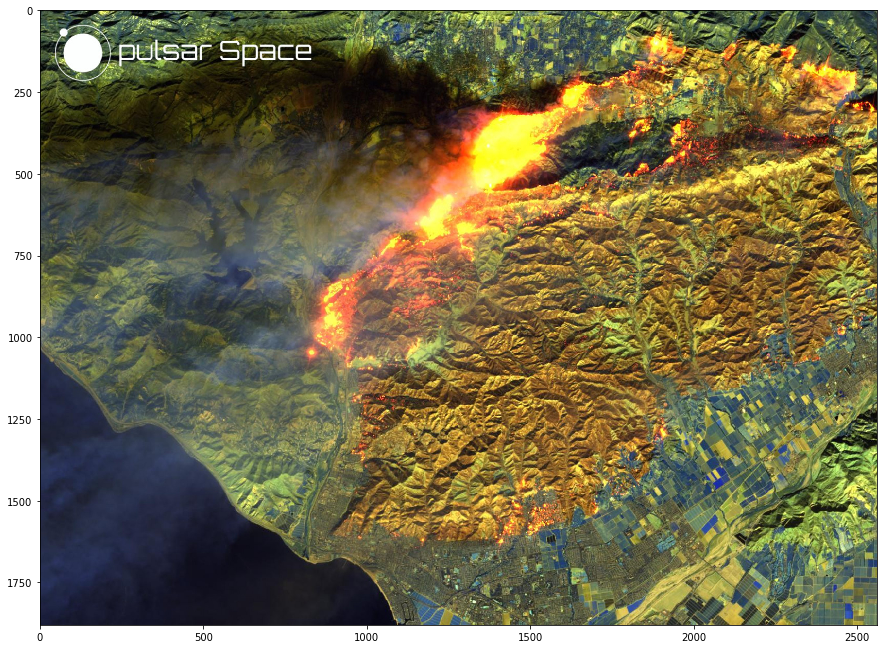

In [4]:
plt.figure(figsize=(15,15))
plt.imshow(image_data)

As the image is an RGB image, the array has 3 dimensions. The 3 dimensions applies to red, green and blue colour bands:

In [5]:
image_data.shape

(1880, 2560, 3)

Print of the image data will give the pixel values at each row and column

In [6]:
image_data[0,0]

Array([53, 72, 66], dtype=uint8)

In [7]:
print(image_data)

[[[ 53  72  66]
  [ 57  76  70]
  [ 68  87  81]
  ...
  [ 73  87  64]
  [ 56  70  45]
  [ 48  62  37]]

 [[ 60  79  73]
  [ 60  79  73]
  [ 63  82  76]
  ...
  [ 77  91  68]
  [ 62  76  51]
  [ 56  70  45]]

 [[ 69  88  82]
  [ 62  81  75]
  [ 55  74  68]
  ...
  [ 82  96  73]
  [ 73  87  62]
  [ 71  85  60]]

 ...

 [[ 23  27  54]
  [ 24  28  55]
  [ 24  28  55]
  ...
  [101 123  84]
  [103 125  87]
  [106 131  92]]

 [[ 23  27  54]
  [ 23  27  54]
  [ 24  28  55]
  ...
  [102 124  85]
  [101 126  87]
  [105 130  91]]

 [[ 23  27  54]
  [ 23  27  54]
  [ 23  27  54]
  ...
  [100 125  85]
  [101 126  87]
  [105 130  91]]]


The shape of the array shows that it is a three layered matrix.  The first two numbers represents the length and width of the image, and the third number (i.e. 3) is for three layers: Red, Green and Blue.

<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold">
RGB Color Mapping in the Photo:</p>


> * <p style="font-family: Arial; font-size:1.5em;color:red; font-style:bold">
RED pixel indicates Altitude</p>
       
> * <p style="font-family: Arial; font-size:1.5em;color:green; font-style:bold">
GREEN pixel indicates Slope
</p>

> * <p style="font-family: Arial; font-size:1.5em;color:blue; font-style:bold">
BLUE pixel indicates Aspect
</p>

The higher values denote higher altitude, aspect and slope.

In [11]:
image_data.size

14438400

In [12]:
image_data.min(), image_data.max()

(0, 255)

<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold"><br>
Pixel on the 100th Row and 200th Column</p>

In [14]:
image_data[100, 200]

Array([101, 115,  98], dtype=uint8)

It seems to have higher blue intensity. We can access one of the colors, say, the green shade by:

In [15]:
image_data[100, 200, 1]

115

<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold"><br>
Set a Pixel to All Zeros</p>
<br/>
We can set all three layer in a pixel at once by assigning zero globally to that (row,column) pairing. We will not be able to see any noticable change in the image as we are chaging just one pixel value.

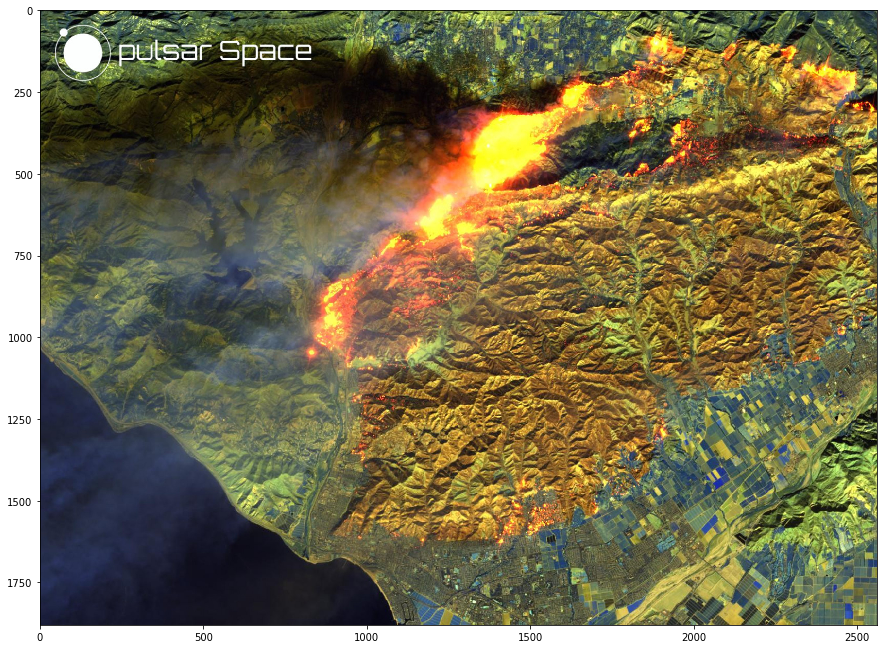

In [16]:
image_data = imageio.imread('./wildfire/cf_fire.jpg')
image_data[100, 200] = 0
plt.figure(figsize=(15,15))
plt.imshow(image_data)

<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold"><br>
Changing colors in a Range<p/>
<br/>
We can also use a range to change the pixel values. As an example, let's set the green layer for rows 200 to 800 to full intensity.

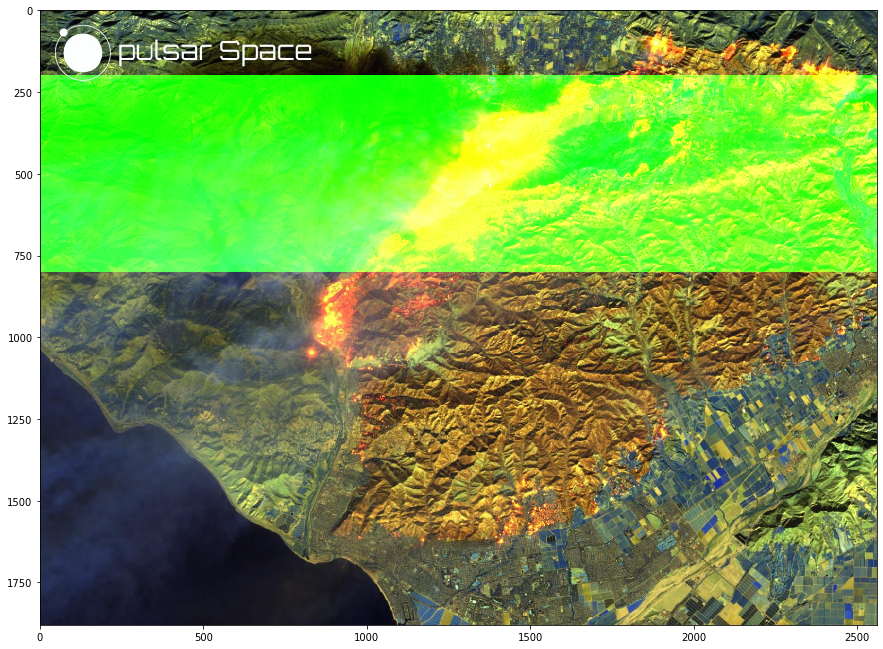

In [17]:
image_data = imageio.imread('./wildfire/cf_fire.jpg')

image_data[200:800, : ,1] = 255
plt.figure(figsize=(15,15))
plt.imshow(image_data)

Let's set all the colors to full intensity in the column range 200 to 800.

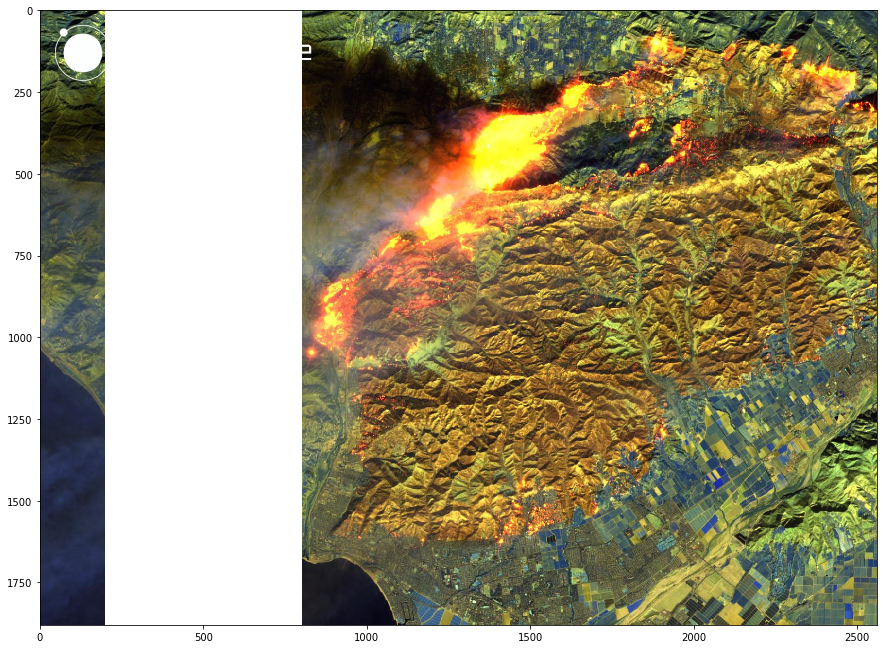

In [18]:
image_data = imageio.imread('./wildfire/cf_fire.jpg')

image_data[:,200:800, :] = 255
plt.figure(figsize=(15,15))
plt.imshow(image_data)

Let's set all the colors to low intensity in the row range 200 to 800.

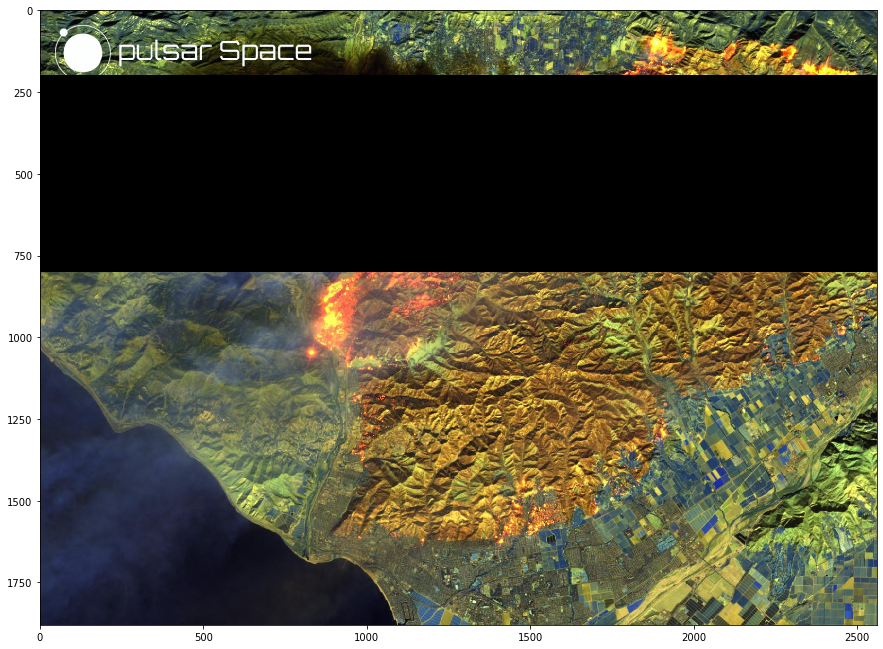

In [19]:
image_data = imageio.imread('./wildfire/cf_fire.jpg')

image_data[200:800,:,:] = 0
plt.figure(figsize=(15,15))
plt.imshow(image_data)

<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold"><br>
Pick all Pixels with Low Values</p>

In [99]:
image_data = imageio.imread('./wildfire/cf_fire.jpg')
print("Shape of image_data:", image_data.shape)
low_value_filter = image_data < 200
print("Shape of low_value_filter:", low_value_filter.shape)

Shape of image_data: (1880, 2560, 3)
Shape of low_value_filter: (1880, 2560, 3)


<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold">
Filtering Out Low Values</p><br/>

The original image is:

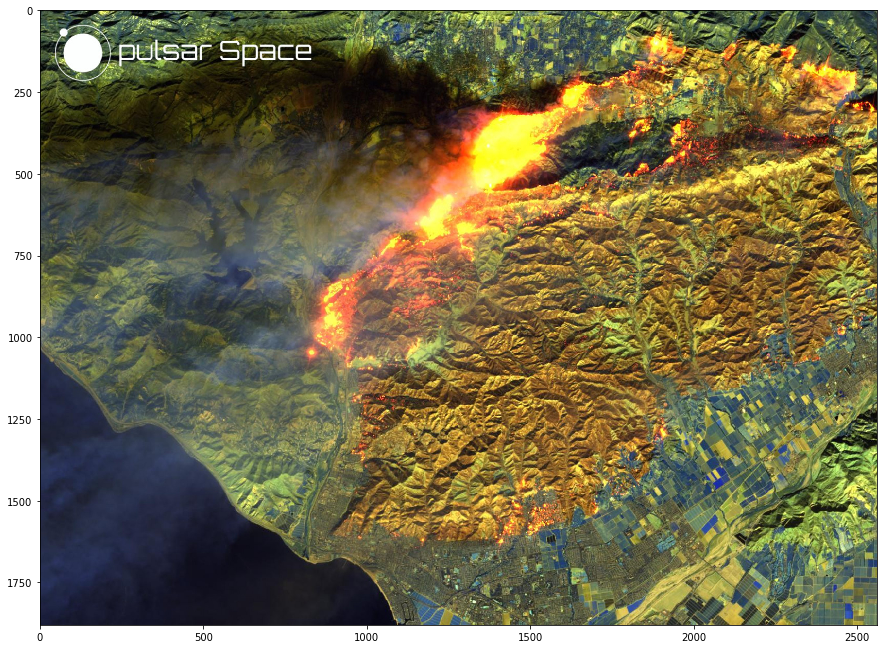

In [100]:
plt.figure(figsize=(15,15))
plt.imshow(image_data)

low_value_filter=0 will set the pixel values to zero where ever low_value_filter is True.

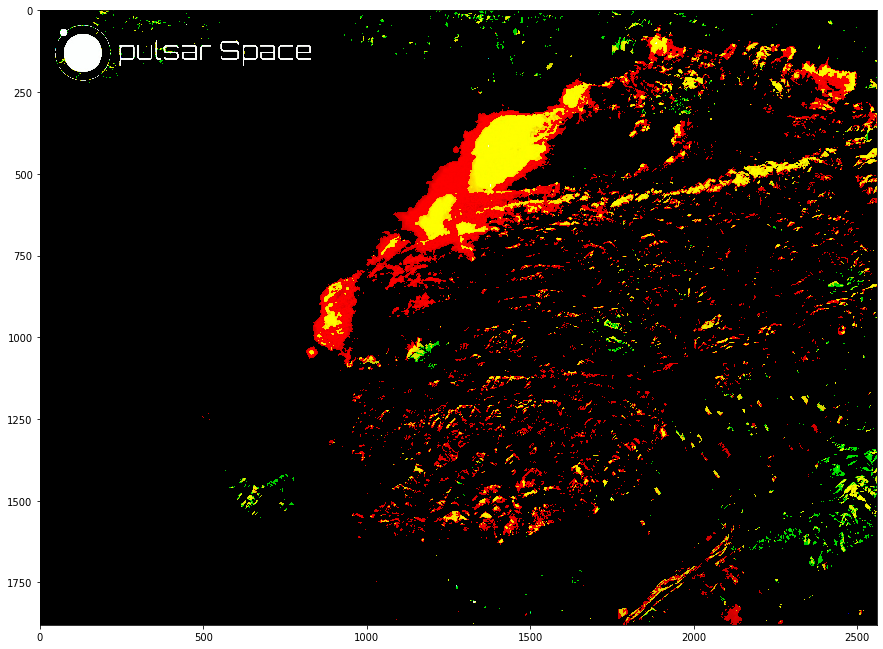

In [101]:
image_data[low_value_filter] = 0
plt.figure(figsize=(15,15))
plt.imshow(image_data)

<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold">
More Row and Column Operations</p><br>

You can design complex patters by making cols a function of rows or vice-versa. Here we try a linear relationship between rows and columns.

In [156]:
rows_range = np.arange(image_data.shape[0])
cols_range = rows_range

In [157]:
cols_range

array([   0,    1,    2, ..., 1877, 1878, 1879])

In [158]:
rows_range

array([   0,    1,    2, ..., 1877, 1878, 1879])

In [159]:
image_data = imageio.imread('./wildfire/cf_fire.jpg')
image_data[rows_range, cols_range] = 255

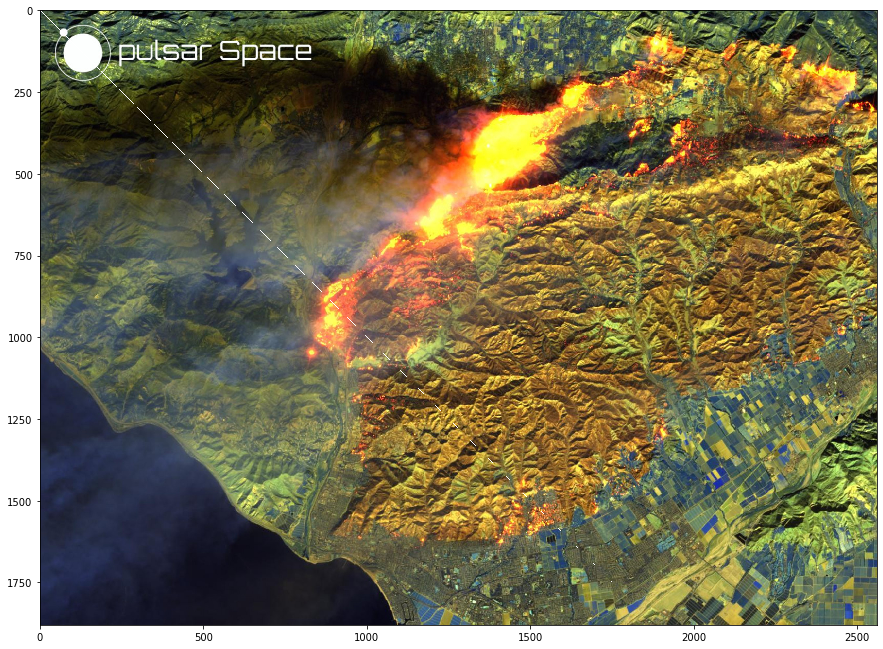

In [160]:
plt.figure(figsize=(15,15))
plt.imshow(image_data)

<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold"><br>
Masking Images</p>
<br>

Create a mask that is in shape of a circular disc and use it to mask the portion. np.ogrid (open gridd) helps in creating an index of rows and columns which can be used to manipulate specific pixels in the image.

In [223]:
total_rows, total_cols, total_layers = image_data.shape
print("image_data = ", image_data.shape, "\ntotal_rows= ", total_rows, 
      "\ntotal_cols= ", total_cols,"\ntotal_layers= ", total_layers)

X, Y = np.ogrid[0:total_rows, 0:total_cols]
print("\n\nX = ", X.shape, " and \nY = ", Y.shape)

image_data =  (1880, 2560, 3) 
total_rows=  1880 
total_cols=  2560 
total_layers=  3


X =  (1880, 1)  and 
Y =  (1, 2560)


In [224]:
center_row, center_col = total_rows / 2, total_cols / 2
print("center_row = ", center_row, "and center_col = ", center_col)

center_row =  940.0 and center_col =  1280.0


In [225]:
print("X - center_row is ",X - center_row, "and \nY - center_col is ",Y - center_col)

X - center_row is  [[-940.]
 [-939.]
 [-938.]
 ...
 [ 937.]
 [ 938.]
 [ 939.]] and 
Y - center_col is  [[-1280. -1279. -1278. ...  1277.  1278.  1279.]]


In [264]:
dist_from_center = (X - center_row)**2 + (Y - center_col)**2
radius = (total_rows / 2)**2
circular_mask = (dist_from_center > radius)
print(circular_mask)

[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


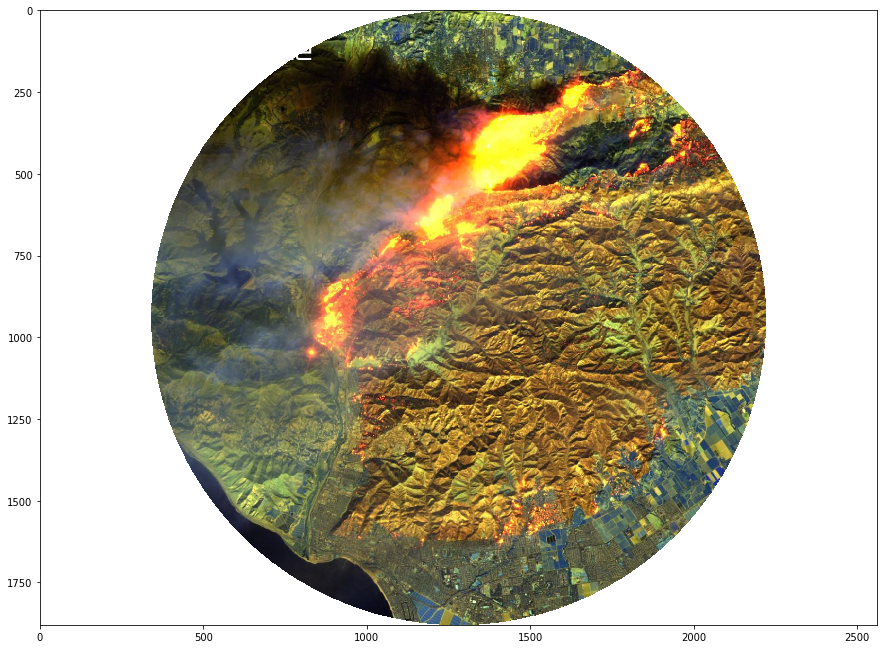

In [265]:
image_data = imageio.imread('./wildfire/cf_fire.jpg')
image_data[circular_mask] = 255
plt.figure(figsize=(15,15))
plt.imshow(image_data)

<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold">
Masking upper half</p>
<br/>

We will mask to get half disc.

In [260]:
X, Y = np.ogrid[:total_rows, :total_cols]
upper_half = X < center_row #generates mask for all rows above the center
upper_half_mask = np.logical_and(upper_half, circular_mask)

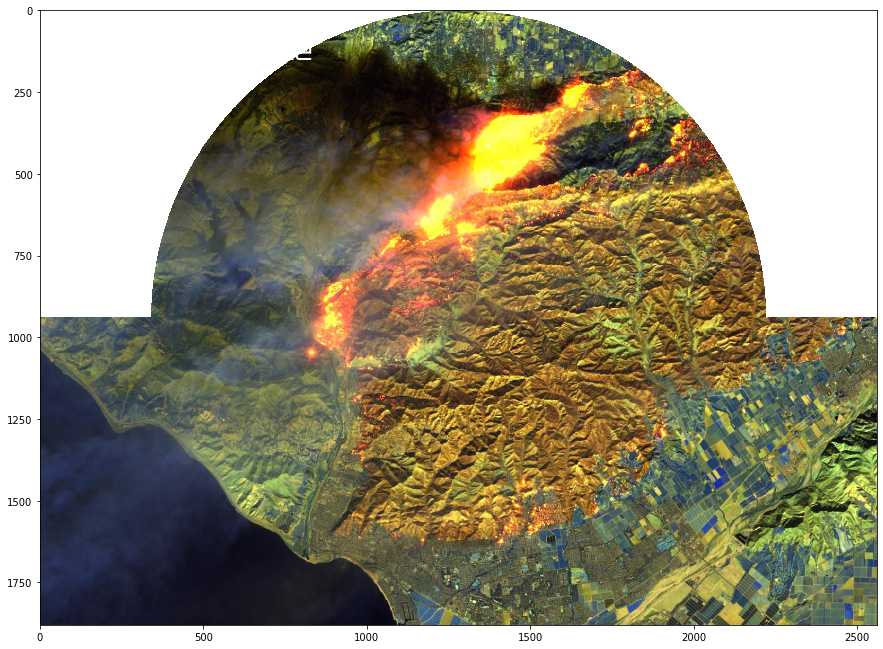

In [270]:
image_data = imageio.imread('./wildfire/cf_fire.jpg')
image_data[half_upper_mask] = 255
plt.figure(figsize=(15,15))
plt.imshow(image_data)

### Exercise: Show the upper semi circle only

<p style="font-family: Arial; font-size:2.75em;color:Green; font-style:bold"><br>
Further Processing of Satellite Image </p>

<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold">
Processing of RED Pixels</p>

Remember that red pixels tell us about the height. Let us try to highlight all the high altitude areas. We will do this by detecting high intensity RED Pixels and muting down other areas.

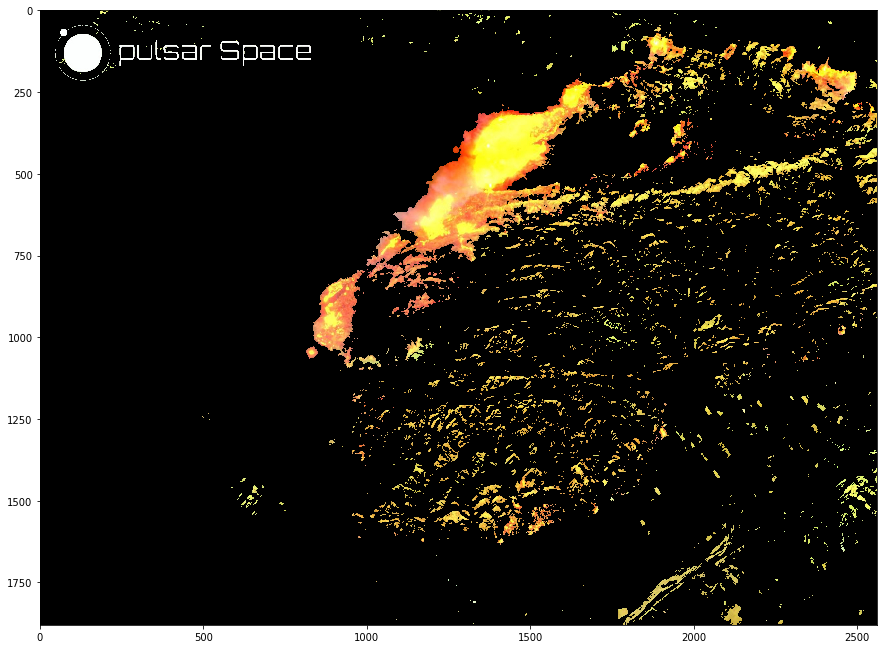

In [283]:
image_data = imageio.imread('./wildfire/cf_fire.jpg')
red_mask   = image_data[:, : ,0] < 200

image_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(image_data)

<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold"><br>
Detecting Highl-GREEN Pixels</p>

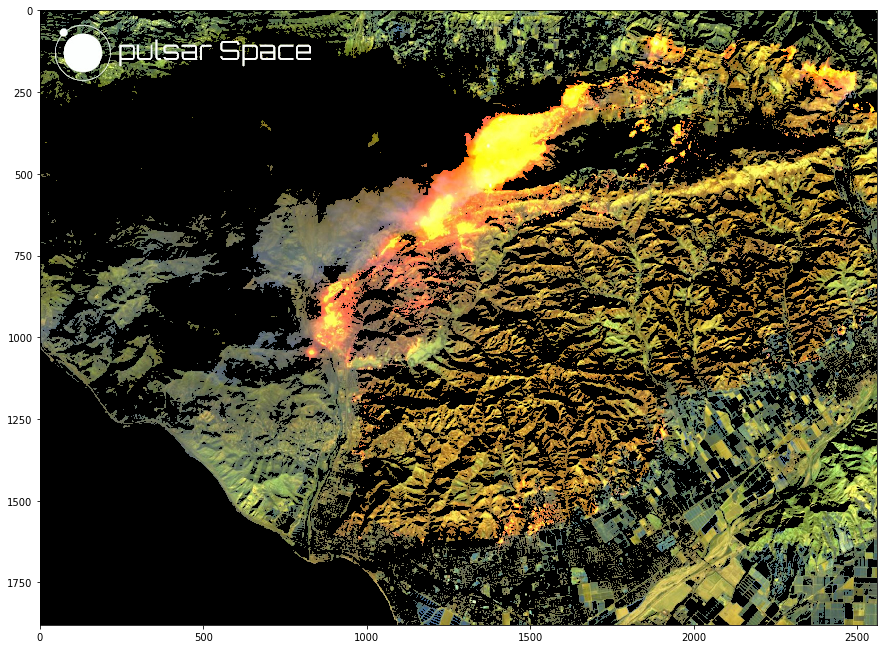

In [280]:
image_data = imageio.imread('./wildfire/cf_fire.jpg')
green_mask = image_data[:, : ,1] < 100

image_data[green_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(image_data)

<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold"><br>
Detecting Highly-BLUE Pixels</p>

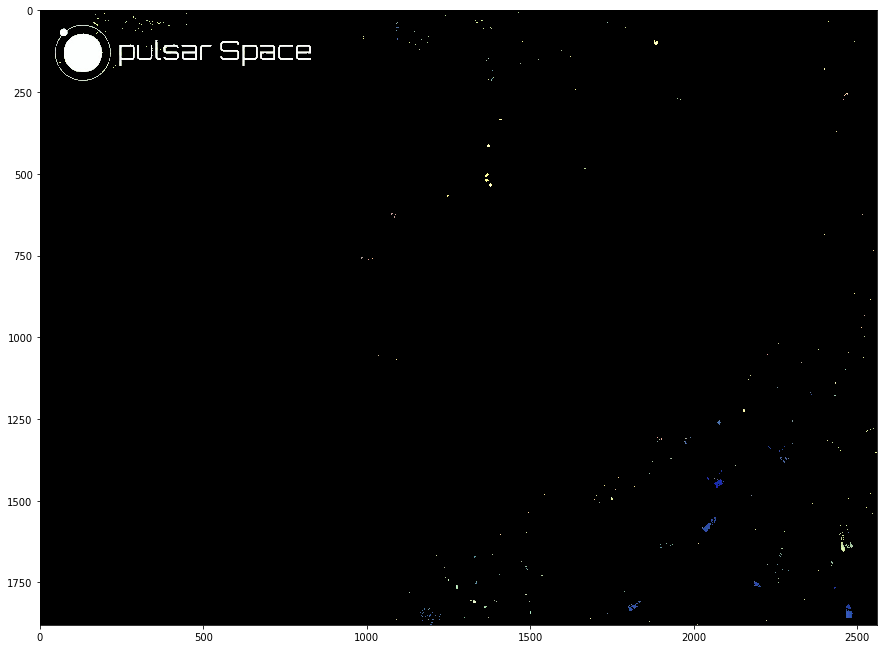

In [279]:
image_data = imageio.imread('./wildfire/cf_fire.jpg')
blue_mask  = image_data[:, : ,2] < 150

image_data[blue_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(image_data)

<p style="font-family: Arial; font-size:1.75em;color:Green; font-style:bold"><br>

Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE</p>

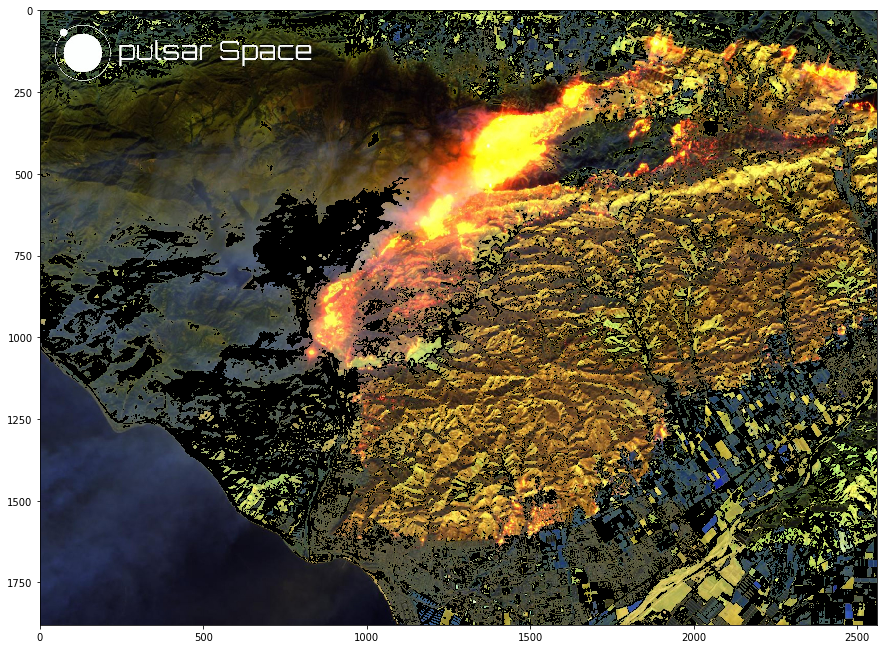

In [41]:
image_data = imageio.imread('./wildfire/cf_fire.jpg')

red_mask   = image_data[:, : ,0] < 150
green_mask = image_data[:, : ,1] > 100
blue_mask  = image_data[:, : ,2] < 100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
image_data[final_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(image_data)

End of Document
***